In [10]:
# Packages
import warnings
warnings.filterwarnings('ignore')
import json
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import missingno
from pandas_profiling import ProfileReport
import house_prices
import house_prices.adhoc_functions.exploratory as exploratory
%matplotlib inline

In [11]:
# Options
sns.set_style("whitegrid")
pd.set_option('display.max_rows', 200)
pd.set_option('display.max_columns', 100)
pd.set_option('display.width', -1)

In [12]:
linear_data = './data/transformed_data/model_train_linear.csv'
df = pd.read_csv(linear_data)
df.head()

,Id,SalePrice,OverallQual,ExterQual,ExterCond,OverallCond,TotalBsmtSF,1stFlrSF,2ndFlrSF,GrLivArea,LotArea,BsmtFullBath,BsmtHalfBath,YearBuilt,FullBath,HalfBath,TotRmsAbvGrd,BedroomAbvGr,KitchenAbvGr,HeatingQC,GarageCars,OpenPorchSF,YearRemodAdd,YrSold,PoolArea,WoodDeckSF,MasVnrArea,KitchenQual,Fireplaces,GarageArea,Neighborhood,MSZoning,BldgType,Functional,MSSubClass,Condition1,LotConfig,MasVnrType,SaleType,SaleCondition,Foundation,HouseStyle,Stories,HasPorch,IsRemodelled,PropertyAge,TotalBath,HasPool,HasDeck,OverallGrade,ExterGrade,TotalArea,CoreArea,Neighborhood_ordinal,MSSubClass_ordinal,MasVnrType_ordinal,Foundation_ordinal,SaleType_ordinal,SaleCondition_ordinal,Stories_1,Stories_2,Stories_S
0,1,208500,0.666667,0.666667,0.5,0.500,0.131114,0.113132,0.346111,0.230501,0.032874,1,0,0.949275,0.500000,0.25,0.500000,0.375,0.333333,1.00,0.50,4.127134,0.883333,0.50,0.0,0.000000,0.115558,0.666667,0.000000,0.326754,CollgCr,RL,1Fam,Typ,60,Norm,Inside,BrkFace,Deed,Normal,PConc,2Story,2,1,1,0.036765,0.5,0,0,0.382022,0.409091,0.215712,0.195481,0.666667,1.000000,1.0,1.000000,0.333333,0.5,0,1,0
1,2,181500,0.555556,0.333333,0.5,0.875,0.187762,0.193049,0.000000,0.161124,0.038061,0,1,0.753623,0.333333,0.25,0.333333,0.375,0.333333,1.00,0.50,0.000000,0.433333,0.25,0.0,5.700444,0.000000,0.333333,0.333333,0.280960,Veenker,RL,1Fam,Typ,20,Feedr,FR2,None,Deed,Normal,CBlock,1Story,1,0,1,0.227941,0.3,0,1,0.528090,0.272727,0.186416,0.191802,0.791667,0.714286,0.5,0.666667,0.333333,0.5,1,0,0
2,3,223500,0.666667,0.666667,0.5,0.500,0.140260,0.126161,0.350213,0.241808,0.045458,1,0,0.934783,0.500000,0.25,0.333333,0.375,0.333333,1.00,0.50,3.761200,0.866667,0.50,0.0,0.000000,0.096446,0.666667,0.333333,0.356816,CollgCr,RL,1Fam,Typ,60,Norm,Inside,BrkFace,Deed,Normal,PConc,2Story,2,1,0,0.051471,0.5,0,0,0.382022,0.409091,0.228626,0.207742,0.666667,1.000000,1.0,1.000000,0.333333,0.5,0,1,0
3,4,140000,0.666667,0.333333,0.5,0.500,0.116655,0.134420,0.311961,0.231548,0.037836,1,0,0.311594,0.333333,0.00,0.416667,0.375,0.333333,0.75,0.75,3.583519,0.333333,0.00,0.0,0.000000,0.000000,0.666667,0.333333,0.373459,Crawfor,RL,1Fam,Typ,70,Norm,Corner,None,Deed,Abnorml,BrkTil,2Story,2,1,0,0.669118,0.2,0,0,0.382022,0.272727,0.210570,0.187336,0.750000,0.642857,0.5,0.333333,0.333333,0.0,0,1,0
4,5,250000,0.777778,0.666667,0.5,0.500,0.171764,0.170666,0.412062,0.300969,0.058812,1,0,0.927536,0.500000,0.25,0.583333,0.500,0.333333,1.00,0.75,4.442651,0.833333,0.50,0.0,5.262690,0.197826,0.666667,0.333333,0.463459,NoRidge,RL,1Fam,Typ,60,Norm,FR2,BrkFace,Deed,Normal,PConc,2Story,2,1,1,0.058824,0.5,0,1,0.438202,0.409091,0.291343,0.263531,0.958333,1.000000,1.0,1.000000,0.333333,0.5,0,1,0


In [13]:
keep_vars = [
    'SalePrice',            # Target
    'OverallQual',          # 0.8
    'ExterQual',            # 0.7
    'YearBuilt',            # 0.5
    'YearRemodAdd',         # 0.5
    'MasVnrArea',           # 0.5
    'TotalBsmtSF',          # 0.6
    '1stFlrSF',             # 0.6
    'GrLivArea',            # 0.7
    'FullBath',             # 0.6
    'KitchenQual',          # 0.7
    'TotRmsAbvGrd',         # 0.5
    'Fireplaces',           # 0.5
    'GarageCars',           # 0.6
    'GarageArea',           # 0.6
    'PropertyAge',          #-0.5
    'TotalBath',            # 0.6
    'HasPorch',             # 0.4
    'HeatingQC',            # 0.4
    'TotalArea',            # 0.8
    'CoreArea',             # 0.8
    'Neighborhood_ordinal', # 0.7
    'MSSubClass_ordinal',   # 0.5
    'MasVnrType_ordinal',   # 0.4
    'Foundation_ordinal',   # 0.5 
    'SaleType_ordinal',     # 0.4
    'SaleCondition_ordinal',# 0.3
]

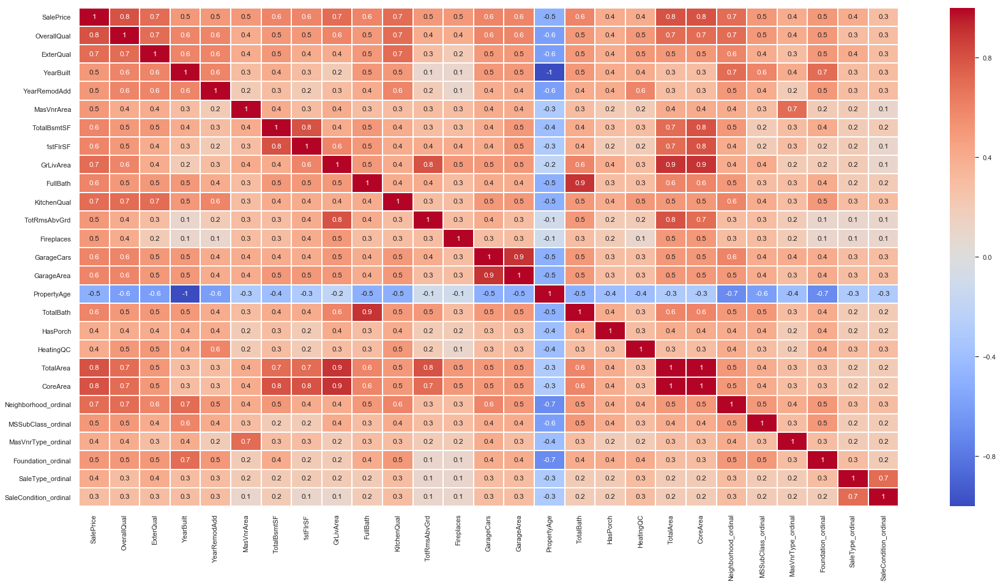

In [14]:
df_corr = exploratory.correlation_heatmap(df, keep_vars=keep_vars)

In [15]:
ProfileReport(df[keep_vars])

Number of variables,27
Number of observations,1460
Total Missing (%),0.0%
Total size in memory,308.0 KiB
Average record size in memory,216.1 B
Numeric,23
Categorical,0
Boolean,1
Date,0
Text (Unique),0
Rejected,3


In [19]:
sns.set(font_scale=8)
pairplot1 = sns.pairplot(
    data=df[[
    'SalePrice',            # Target
#     'OverallQual',          # 0.8
#     'ExterQual',            # 0.7
#     'YearBuilt',            # 0.5
#     'YearRemodAdd',         # 0.5
#     'MasVnrArea',           # 0.5
#     'TotalBsmtSF',          # 0.6
#     '1stFlrSF',             # 0.6
#     'GrLivArea',            # 0.7
    'TotRmsAbvGrd',         # 0.5
    'GarageArea',           # 0.6
    'TotalBath',            # 0.6
    'Neighborhood_ordinal', # 0.7
    'MSSubClass_ordinal',   # 0.5
    'Foundation_ordinal',   # 0.5 
]],
    diag_kind='kde',
    kind="reg",
    height=20
)

In [20]:
sns.set(font_scale=8)
pairplot1 = sns.pairplot(
    data=df[[
    'SalePrice',            # Target
    'OverallQual',          # 0.8
    'ExterQual',            # 0.7
    'YearBuilt',            # 0.5
    'YearRemodAdd',         # 0.5
    'MasVnrArea',           # 0.5
    'TotalBsmtSF',          # 0.6
    '1stFlrSF',             # 0.6
    'GrLivArea',            # 0.7
#     'TotRmsAbvGrd',         # 0.5
#     'GarageArea',           # 0.6
#     'TotalBath',            # 0.6
#     'Neighborhood_ordinal', # 0.7
#     'MSSubClass_ordinal',   # 0.5
#     'Foundation_ordinal',   # 0.5 
]],
    diag_kind='kde',
    kind="reg",
    height=20
)

In [ ]:
tb = exploratory.explore_feature(df, 'SaleType', 'SalePrice', font_scale=2)

In [ ]:
tb_hue = exploratory.explore_feature_hue(df, 'Neighborhood', 'SalePrice', 'Foundation', palette='bright')